In [ ]:
#Drive'mi bağladığım kısım.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import random
import zipfile
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, GlobalAveragePooling2D, Dropout, BatchNormalization, Input
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.applications.vgg16 import VGG16, preprocess_input



In [ ]:
batch_size = 128 #eğitim verilerinin kaç parçaya bölüneceğini belirler
seed = 666 # rastgele üretilen sayının başlangıç değeri
tf.random.set_seed(seed) #rastgele sayı üreteçlerini kullanarak ağırlıkları veya diğer parametreleri başlatır
np.random.seed(seed) #rastgele sayı üretme işlevi için bir seed sayısı belirler
os.environ["PYTHONHASHSEED"] = str(seed)#belirtilen seed değerini bir ortam değişkeni olarak ayarlar.Ortam değişkenleri, işletim sistemi ortamında depolanan anahtar-değer çiftleri olarak düşünülebilir                
random.seed(666)#666 sayısını rastgele sayı üretmek için kullanılan başlangıç değeri olarak ayarlar.

<a id="section-one"></a>

# 1) VERİSETİNİ ZİPTEN ÇIKARMA

In [ ]:
os.listdir("/content/drive/MyDrive/kedi_kopek")

['sampleSubmission.csv', 'test1.zip', 'train.zip']

In [ ]:
TRAIN_PATH = "/content/drive/MyDrive/kedi_kopek/train.zip"
TEST_PATH = "/content/drive/MyDrive/kedi_kopek/test1.zip"

FILES = "/content/drive/MyDrive/kedi_kopek_unzip"

with zipfile.ZipFile(TRAIN_PATH, 'r') as zipp:
    zipp.extractall(FILES)
    
with zipfile.ZipFile(TEST_PATH, 'r') as zipp:
    zipp.extractall(FILES)

In [ ]:
train_df = pd.DataFrame({"file": os.listdir("/content/drive/MyDrive/kedi_kopek_unzip/train")})
train_df["label"] = train_df["file"].apply(lambda x: x.split(".")[0])# cat ve dog etiketinin atandıgı kısım .dan önceki kısım bizim etiketimiz

train_df

,file,label
0,cat.0.jpg,cat
1,cat.1.jpg,cat
2,cat.10.jpg,cat
3,cat.100.jpg,cat
4,cat.1000.jpg,cat
...,...,...
14995,dog.995.jpg,dog
14996,dog.996.jpg,dog
14997,dog.997.jpg,dog
14998,dog.998.jpg,dog


In [ ]:
test_df = pd.DataFrame({"file": os.listdir("/content/drive/MyDrive/kedi_kopek_unzip/test1")})

test_df.head()

,file
0,1.jpg
1,10.jpg
2,100.jpg
3,1000.jpg
4,1001.jpg


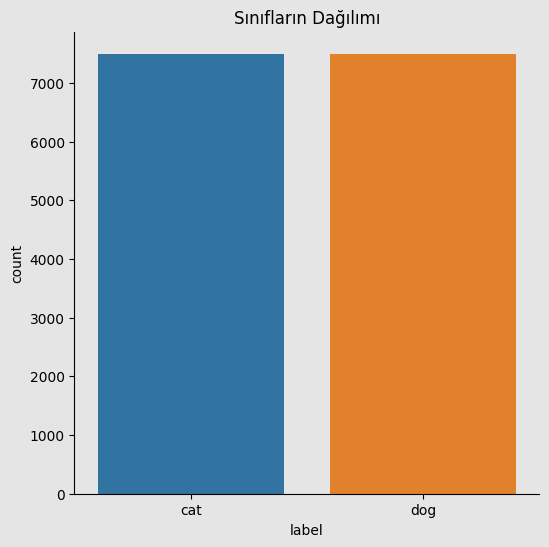

In [ ]:
fig, ax = plt.subplots(figsize = (6, 6), facecolor = "#e5e5e5")
ax.set_facecolor("#e5e5e5")

sns.countplot(x = "label", data = train_df, ax = ax)

ax.set_title("Sınıfların Dağılımı")
sns.despine()
plt.show()

<a id="section-two"></a>

# 2) Örnek görüntüler

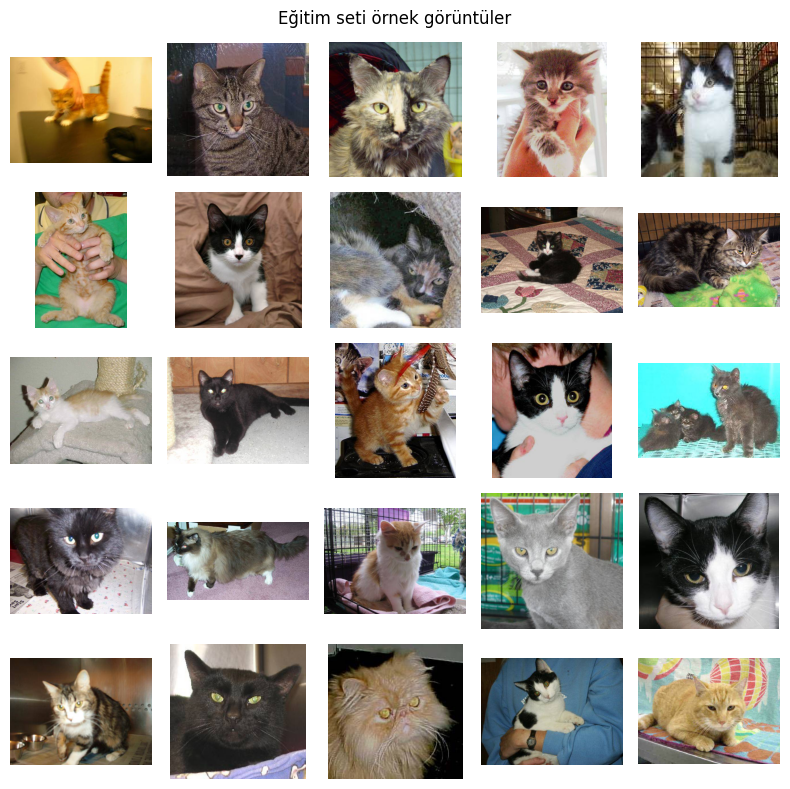

In [ ]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Eğitim seti örnek görüntüler")

for i in range(25):

    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "/train/" + train_df["file"][i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()



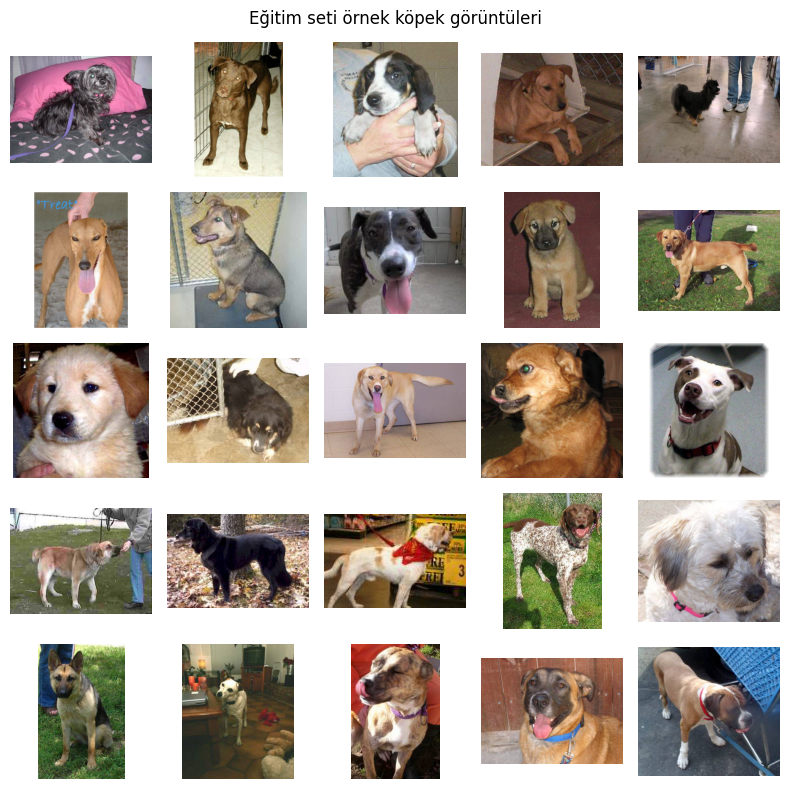

In [ ]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Eğitim seti örnek köpek görüntüleri")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "/train/" + train_df.query("label == 'dog'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()



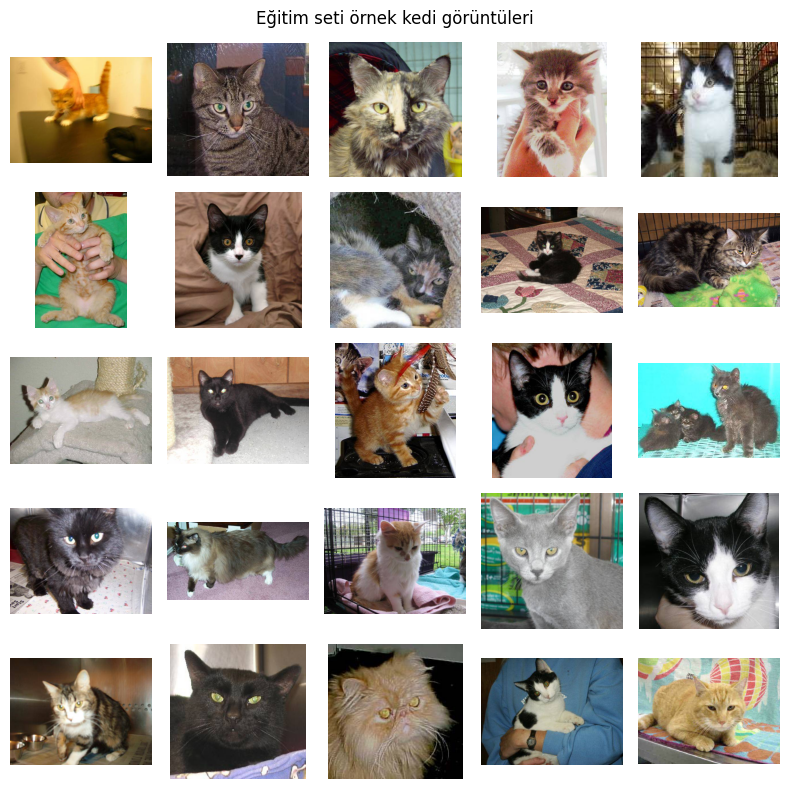

In [ ]:
fig = plt.figure(1, figsize = (8, 8))
fig.suptitle("Eğitim seti örnek kedi görüntüleri")

for i in range(25):
    
    plt.subplot(5, 5, i + 1)
    image = load_img(FILES + "/train/" + train_df.query("label == 'cat'").file.values[i])
    plt.imshow(image)
    plt.axis("off")
    
plt.tight_layout()
plt.show()

<a id="section-three"></a>

# 3) VGG-16

<a id="section-three3"></a>

## VGG-16 UYGULANMASI

In [ ]:
def VGG_16(input_shape = (224, 224, 3), n_classes = 1000):
    
    model = Sequential(
        [
            Conv2D(filters = 64, kernel_size = (3, 3), padding = "same", activation = "relu", input_shape = input_shape),#filters bir katmandaki filtre sayısını belirtir. filtreler girdi verileri üzerinde konvolüsyon işlemi uygular
            Conv2D(filters = 64, kernel_size = (3, 3), padding = "same", activation = "relu"), #filtre boyutu her konvolüsyon adımında alınan pencerenin boyutunu belilrer
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 128, kernel_size = (3, 3), padding = "same", activation = "relu"),#padding: same veya valid değerini alır. same dolgusu giriş boyutunu korumak için etrafına sıfırlar ekler. 
            Conv2D(filters = 128, kernel_size = (3, 3), padding = "same", activation = "relu"),#valid dolgusu ise dolgu yapmadan konvolüsyon işlemini uygular ve giriş boyutunu küçültür.same genellikle giriş boyutunu korumak ve bilgi kaybını azaltmak için tercih edilir.
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),#strides konvolüsyon veya havuzlama katmanlarının adım boyutunu kontrol eder.adım boyutı filtre veya havuzlama penceresinin kaydırma miktarını belirler
            
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 256, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            Conv2D(filters = 512, kernel_size = (3, 3), padding = "same", activation = "relu"),
            MaxPool2D(pool_size = (2, 2), strides = (2, 2)),
            
            Flatten(),#Flatten() katmanı çok boyutlu verileri düzleştirerek  vektör haline getirir. daha sonra gelen tam bağlantılı katmanlara uygun bir şekilde işleyebilmek için kullanılır
            Dense(units = 4096, activation = "relu"),#bu katmanın çıktı boyutunu belirler daha fazla birim daha karmaşık bir modelin öğrenilmesine yardımcı olabilir ancak hesaplama maliyetini de artırır
            Dense(units = 4096, activation = "relu"),
            Dense(units = n_classes, activation = "softmax")
        ]
    )
    
    return model

<a id="section-four"></a>

# 4) VERİ İŞLEME VE ÇOĞALTMA

In [ ]:
# train_test_split fonksiyonu kullanılarak veri kümesi train ve test olarak bölünüyoruz
# test_size parametresi, veri kümesinin %20'sinin test (val) kümesi olarak ayrılacağını belirtiyoruz
train_data, val_data = train_test_split(train_df, 
                                        test_size = 0.2, 
                                        stratify = train_df["label"], #verilerin sınıf etiketlerine göre bölünmesini sağlıyoruz
                                        random_state = 666) #  bölme işleminin tekrarlanabilir olması için bir çekirdek değeri belirtiyoruz

<a id="section-four1"></a>

## Veri Çoğaltma

Found 1 validated image filenames belonging to 1 classes.


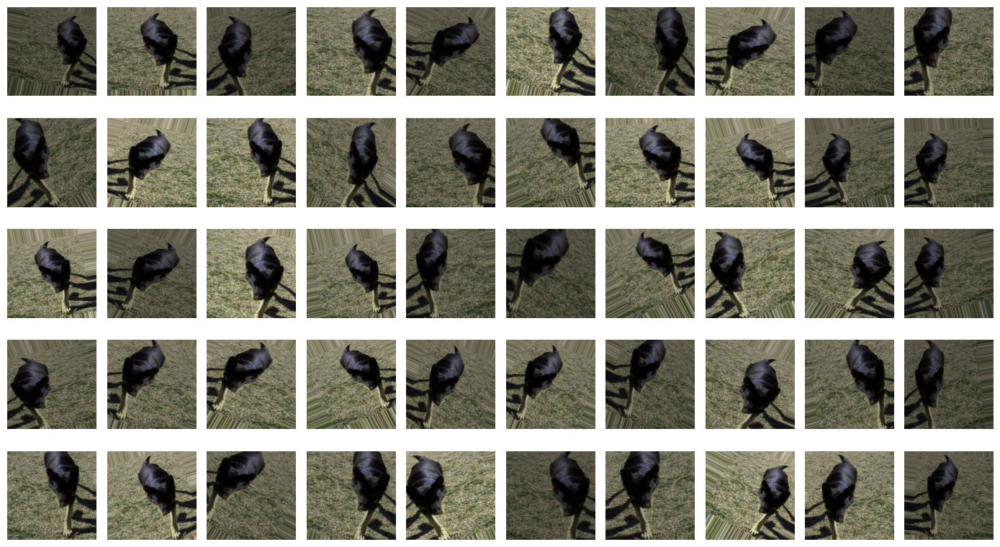

In [ ]:
#görüntü veri artırma için ImageDataGenerator nesnesi oluşturulur ve parametreler belirlenir
datagen = ImageDataGenerator(
    rotation_range=30,  #görüntüyü rastgele döndürme açısı aralığı
    width_shift_range=0.1,  #görüntüyü yatayda rastgele kaydırma aralığı
    height_shift_range=0.1,  #görüntüyü dikeyde rastgele kaydırma aralığı
    brightness_range=(0.5, 1),  #görüntü parlaklık aralığı
    zoom_range=0.2,  #görüntüyü rastgele yakınlaştırma,aralıklı yakınlaştırma aralığı
    horizontal_flip=True,  # Görüntüyü yatayda rastgele çevirme
    rescale=1./255  #piksel değerlerini 0, 255 aralığından 0, 1 aralığına ölçekleme yap
)

#ornek bir veri noktası seç
sample_df = train_data.sample(1)

#veri çerçevesi ve diğer parametreler kullanılarak bir veri akışı oluşturulur
sample_generator = datagen.flow_from_dataframe( 
    dataframe=sample_df, #verilerin bulunduğu veri çerçevesini belirtir. sample_df değişkeni bu parametreye atanmıştır
    directory=FILES + "/train/", # ana dosyadaki train verisinin yerini gösterir
    x_col="file", #veri setinde görüntü dosyalarının adlarının bulunduğu sütunu belirtir
    y_col="label",#veri setinde etiketlerin bulunduğu sütunu belirtir.
    class_mode="categorical",# etiketleri [1,0] veya [0,1] şeklinde ayarla
    target_size=(224, 224),# goruntulerı 224, 224 boyutunda ayalar
    seed=666 #her çalıştırmada aynı rastgele artırma işlemleri uygulanmsaı için yine 666
)

#grafik boyutunu ayarla
plt.figure(figsize=(14, 8))

#50 örnek için döngü oluşturur
for i in range(50):
    
    plt.subplot(5, 10, i + 1)
    
    # Veri akışından bir topluluk alınır
    for X, y in sample_generator:

        #görğntü göster
        plt.imshow(X[0])
        plt.axis("off")
        break
        
#grafik düzeni ayarla
plt.tight_layout()
plt.show()


In [ ]:
#ImageDataGenerator nesnelerini kullanarak eğitim ve doğrulama veri kaynaklarını oluşturur
train_datagen = ImageDataGenerator(
    rotation_range=15,  #görüntüleri rastgele 15 derece döndürme (-15 , 15 arası gibi değerlr)
    horizontal_flip=True,  #görüntüleri yatay olarak rastgele çevirme
    preprocessing_function=preprocess_input  #görüntüleri VGG16 modeline uygun şekilde önişleme
)

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)  #doğrulama veri seti için önişleme


In [ ]:
#train_generator nesneleri oluşturularak veri artırma ve önişleme işlemleri uygulanmış veri kümeleri elde edilir
train_generator = train_datagen.flow_from_dataframe(
    dataframe = train_data, #eğitim verisini kullan
    directory = FILES + "/train/", #dosya yolunu bekirt
    x_col = "file", #veri setinde görüntü dosyalarının adlarının bulunduğu sütunu belirtir
    y_col = "label",#veri setinde etiketlerin bulunduğu sütunu belirtir.
    class_mode = "categorical",# etiketleri [1,0] veya [0,1] şeklinde ayarla
    target_size = (224, 224),# goruntulerı 224, 224 boyutunda ayalar
    batch_size = batch_size, #kaç veriyi aynı anda işleyeceğini belirtir.
    seed = 666,#her çalıştırmada aynı rastgele artırma işlemleri uygulanmsaı için yine 666
)
#val_generator nesneleri oluşturularak veri artırma ve önişleme işlemleri uygulanmış veri kümeleri elde edilir
val_generator = val_datagen.flow_from_dataframe(
    dataframe = val_data, #test verisini kullan
    directory = FILES + "/train/",#dosya yolunu bekirt
    x_col = "file",  #veri setinde görüntü dosyalarının adlarının bulunduğu sütunu belirtir
    y_col = "label",#veri setinde etiketlerin bulunduğu sütunu belirtir.
    class_mode = "categorical",# etiketleri [1,0] veya [0,1] şeklinde ayarla
    target_size = (224, 224),# goruntulerı 224, 224 boyutunda ayalar
    batch_size = batch_size,#kaç veriyi aynı anda işleyeceğini belirtir.
    seed = 666,#her çalıştırmada aynı rastgele artırma işlemleri uygulanmsaı için yine 666
    shuffle = False # veri setini baştan sona doğru sıralı bir şekilde döndürür , veri sıralamasının korunması, modelin performansını değerlendirirken her bir örneğin yerini bilmenizi sağlar.
)

Found 12000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


<a id="section-five"></a>

# 5) VGG-16 MODELİ 

<a id="section-five1"></a>
## Model oluşturma

In [ ]:
#vgg16 modelinin önceden eğitilmiş ağırlıklarını kullanarak bir model oluşturur
base_model = VGG16(
    weights = "imagenet", #imagenet veri kümesi üzeinde önceden eğitilmiş ağırlıkları kullanacağını anlamına gleir
    input_shape = (224, 224, 3),
    include_top = False #modelin tam bağlı katmanlarını içermemesini ve sadece özellik çıkarma katmanlarını içermesini sağlar
)


for layers in base_model.layers:
    layers.trainable = False #önceden eğitilmiş ağırlıkların güncellenmemesini ve sadece eklenen son katmanların eğitilmesini sağla

'''
Dondurulmuş katmanlar, bir derin öğrenme modelinin eğitimi sırasında güncellenmeyen katmanlardır. 
Bu katmanlar, önceden eğitilmiş bir modelin ağırlıklarını ve özellik çıkarma yeteneklerini korurken, 
üzerine eklenen yeni katmanların eğitilmesine izin verir.
'''

def vgg16_pretrained():
    
    model = Sequential(
        [
            base_model, #önceki eğitilmiş ağırlıkları ilk katman olarak beliliyoruz
            GlobalAveragePooling2D(), #bu katman özellik haritalarını küçülterek ve öz bilgileri çıkarır. modelin daha hızlı ve daha az veriyle eğitilmesini kolaylaştırır
            Dense(100, activation = "relu"),#donmuş katmanın üzerşne 100 nöron içeren bir tam bağlantılı katman ekle
            Dropout(0.4), #bu katman bir önceki katmandan gelen çıkışları 0.4 olasılıkla rastgle bir şekilde atar . bunun amacı overfşttingi engellemektir
            Dense(64, activation = "relu"),#donmuş katmanın üzerşne 64 nöron içeren bir tam bağlantılı katman ekle
            Dense(2, activation = "softmax")# son katman ise 2 adet nörona sahiptir çünkü burada iki sınıf (kedi ve köpek) bulunmaktadır. softmax aktivasyon fonksiyonu kullanılır çünkü çıkışta sınıf olasılıklarını hesaplamak istiyoruz.
        ]
    )
    
    return model

tf.keras.backend.clear_session()# yeni model oluşturmadan once önceki çalışma zamanının kalıntılarını temizler . yeni modele daha iyi eğitim sağlayabilir

58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
model = vgg16_pretrained()#yukarıda tanımladıgımız fonksiyonu çagırarak yeni bir model oluşturuyoruz. hazır modele ek bizim katmanlarımız da vardır

model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = "accuracy")# modelli derle . çok sınıflı sınıflandırma seçtigimiz için "categorical_crossentropy" kullanılıırz

model.summary() # modelin özetini goster katmanları goster

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 100)               51300     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                6464      
                                                                 
 dense_2 (Dense)             (None, 2)                 130       
                                                        

<a id="section-five2"></a>

## Geri dönütler ve En iyi sonucu kaydet 

In [ ]:
# bu geeri dönüt modelin performansı belirli bir süre boyunca gelişmezse öğrenme hızını azaltarak eğitimi iyileştirmeyi amaçlar
reduce_lr = ReduceLROnPlateau(
    monitor = "val_accuracy", #izlenecek değeri gösterir burada dogruluk degerini takip et demek oluyor
    patience = 2, #2 epıch içinde dogruluk oranında iyileşme olmazsa lr oranını aazalt 
    verbose = 1, #epoch işleminde ayrıntıları görüntülemeyi saglar .1 goster. 0 ise gösterme 
    factor = 0.5, #öğrenme oranını azaltma faktörüdür ,öğrenme oranı factor değeriyle çarpılarak azaltılmş olunır
    min_lr = 0.000000001#minimum öğrenme oranı sınırımız
)
#eğitimi belirli bir süre boyunca iyileşme olmadığında durdurmak için kullanılır (patience) gmre belirlenir
early_stopping = EarlyStopping(
    monitor = "val_accuracy",#izlenecek değeri gösterir burada dogruluk degerini takip et demek oluyor
    patience = 5, #5 epıch içinde dogruluk oranında iyileşme olmazsa lr oranını aazalt 
    verbose = 1, #epoch işleminde ayrıntıları görüntülemeyi saglar .1 goster. 0 ise gösterme 
    mode = "max", # iyileşme kriterini belirler izlenen değerin(metriğin) maksimize edilmesi için max yazılır veya minimize edilmesi için min yzılır

)
#bu geri dönütte modelin eğitimi sırasında en iyi doğruluk değerinin yakalanması halinde modelin ağırlıklarını ve yapısını kaydetmek için kullanılır
checkpoint = ModelCheckpoint(
    monitor = "val_accuracy",#izlenecek değeri gösterir burada dogruluk degerini takip et demek oluyor
    filepath = "catdog_vgg16_.{epoch:02d}-{val_accuracy:.6f}.hdf5",# bu dosyayı kaydetme formatıdır . şöyle çalışur . catdog_vgg16_.{hangi epochda en iyi dogruluk deger bulunmus o epoch numarasını yaz}-{buraya da en iyi yakalanan val_accurasy numarasını yaz}.hdf5
    verbose = 1, #epoch işleminde ayrıntıları görüntülemeyi saglar .1 goster. 0 ise gösterme 
    save_best_only = True, #sadece en iyi performansa sahip modelin kaydedilmesini sağlar.true olarak ayarlandığında sadece doğrulama metriği iyileştiğinde kaydetme işlemi gerçekleştirilir.
    save_weights_only = True#sadece model ağırlıklarının kaydedilmesini sağlar.true olarak ayarlandığında sadece model ağırlıkları kaydedilir, modelin yapısı kaydedilmez.
)

<a id="section-five3"></a>

## Eğitim aşaması

In [ ]:
# burası modelli eğittiğimiz kısım
history = model.fit(
    train_generator, #veri artırma tekniklerini çağır
    epochs = 10, #modeli 10 defa eğit
    validation_data = val_generator,#modelin doğrulama performansını izlemek için kullanılır
    validation_steps = val_data.shape[0] // batch_size, #dpğrulama adımlarında kaç örnekle işleme alınacagını belirtir .doğrulama verisi kümesinin boyutunu ve kullanılan batch_size değerini dikkate alarak ayarlar
    steps_per_epoch = train_data.shape[0] // batch_size,#herr bir eğitim adımında eğitim verisinden kaç örnek alınacağını belirten parametredir ,bu eğitim veri kümesinin boyutunu ve kullanılan batch_size değerini dikkate alarak ayarlar
    callbacks = [reduce_lr, early_stopping, checkpoint] #eğitim sırasında çağrılacak geri dönüt işlevlerini içerir
)

Epoch 1/10
93/93 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.9226
Epoch 1: val_accuracy improved from -inf to 0.97520, saving model to catdog_vgg16_.01-0.975204.hdf5
93/93 [==============================] - 249s 2s/step - loss: 0.2630 - accuracy: 0.9226 - val_loss: 0.0577 - val_accuracy: 0.9752 - lr: 0.0010
Epoch 2/10
93/93 [==============================] - ETA: 0s - loss: 0.0891 - accuracy: 0.9675
Epoch 2: val_accuracy improved from 0.97520 to 0.98370, saving model to catdog_vgg16_.02-0.983696.hdf5
93/93 [==============================] - 214s 2s/step - loss: 0.0891 - accuracy: 0.9675 - val_loss: 0.0443 - val_accuracy: 0.9837 - lr: 0.0010
Epoch 3/10
93/93 [==============================] - ETA: 0s - loss: 0.0780 - accuracy: 0.9704
Epoch 3: val_accuracy did not improve from 0.98370
93/93 [==============================] - 219s 2s/step - loss: 0.0780 - accuracy: 0.9704 - val_loss: 0.0484 - val_accuracy: 0.9806 - lr: 0.0010
Epoch 4/10
93/93 [=================

In [ ]:
tf.keras.backend.clear_session()# yeni model oluşturmadan once önceki çalışma zamanının kalıntılarını temizler . yeni modele daha iyi eğitim sağlayabilir

model = vgg16_pretrained()#yukarıda tanımladıgımız fonksiyonu çagırarak yeni bir model oluşturuyoruz. hazır modele ek bizim katmanlarımız da vardır

model.load_weights("/content/catdog_vgg16_.07-0.988111.hdf5")#belirli bir eğitim aşamasında en iyi doğrulama başarısını elde eden ağırlıkları içerir yüklenen ağırlıklar modelin daha önceki eğitimlerden öğrendiği bilgileri içerir ve yeni veriler üzerinde tahmin yapmak için kullanılabilir

<a id="section-six"></a>

# 6) SONUÇLAR VE HATA ANALİZİ


<a id="section-six1"></a>

## Kayıp ve doğruluk grafikleri

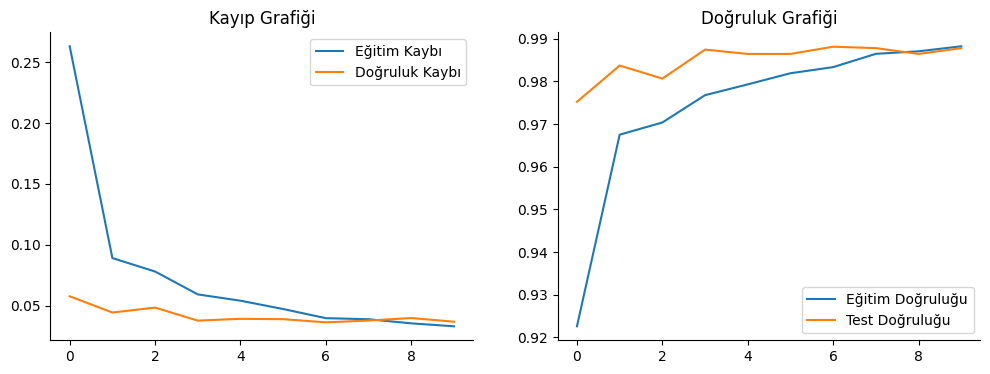

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (12, 4))

sns.lineplot(x = range(len(history.history["loss"])), y = history.history["loss"], ax = axes[0], label = "Eğitim Kaybı")
sns.lineplot(x = range(len(history.history["loss"])), y = history.history["val_loss"], ax = axes[0], label = "Doğruluk Kaybı")

sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["accuracy"], ax = axes[1], label = "Eğitim Doğruluğu")
sns.lineplot(x = range(len(history.history["accuracy"])), y = history.history["val_accuracy"], ax = axes[1], label = "Test Doğruluğu")
axes[0].set_title("Kayıp Grafiği"); axes[1].set_title("Doğruluk Grafiği")

sns.despine()
plt.show()

In [ ]:
val_pred = model.predict(val_generator, steps = np.ceil(val_data.shape[0] / batch_size)) #burası belirtilen veriler üzerindeki dogrulama verilerini kullanarak tahminler üretir
val_data.loc[:, "val_pred"] = np.argmax(val_pred, axis = 1) #athmin sonuçlarındaki en yüksek olasılığa sahip sınıf indeksleri elde edilir

labels = dict((v, k) for k, v in val_generator.class_indices.items()) #sınıf endekslerini ve etiketlerini içeren bir sözlük oluşturur

val_data.loc[:, "val_pred"] = val_data.loc[:, "val_pred"].map(labels) #oluşturulan sozluk kullanılarak sınıf endekslerinin karşılık gelen etiketlerle değiştirilmesi sağlanır böylece tahmin sonuçları etiketlenmiş olarak val_data ya yerleştirilir

24/24 [==============================] - 25s 1s/step


In [ ]:
labels

{0: 'cat', 1: 'dog'}

<a id="section-six2"></a>
## Confusion Matrisi ve sınıflandırma 

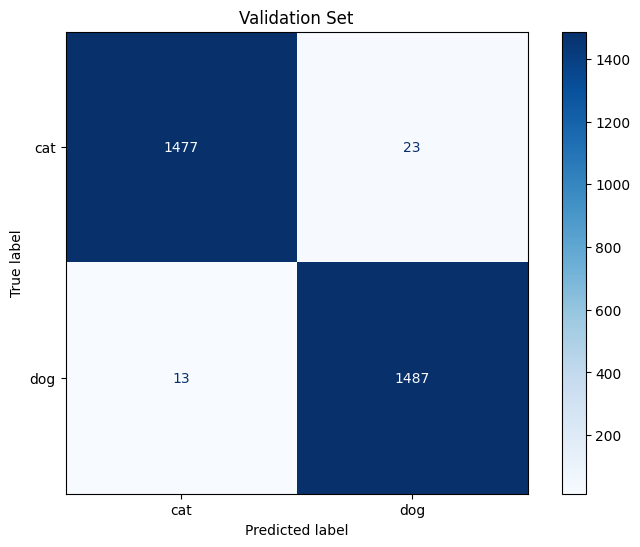

In [ ]:
fig, ax = plt.subplots(figsize = (9, 6))

cm = confusion_matrix(val_data["label"], val_data["val_pred"])

disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ["cat", "dog"])
disp.plot(cmap = plt.cm.Blues, ax = ax)

ax.set_title("Validation Set")
plt.show()

<a id="section-six3"></a>
## Hata analizi

In [ ]:
val_errors = val_data[(val_data.label) != (val_data.val_pred)].reset_index(drop = True)
val_errors

,file,label,val_pred
0,dog.3322.jpg,dog,cat
1,dog.1985.jpg,dog,cat
2,cat.5324.jpg,cat,dog
3,dog.6733.jpg,dog,cat
4,dog.216.jpg,dog,cat
5,cat.6416.jpg,cat,dog
6,dog.2264.jpg,dog,cat
7,cat.4360.jpg,cat,dog
8,dog.6367.jpg,dog,cat
9,dog.5602.jpg,dog,cat


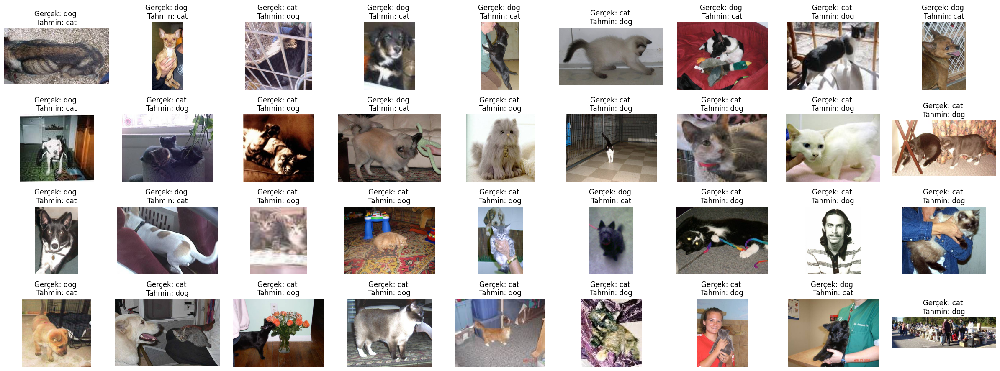

In [ ]:
fig = plt.figure(1, figsize = (24, 20))

for i in range(36):
    
    plt.subplot(9, 9, i + 1)
    image = load_img("/content/drive/MyDrive/kedi_kopek_unzip/train/" + val_errors.file[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Gerçek: {val_errors['label'][i]} \nTahmin: {val_errors['val_pred'][i]}")    
    
plt.tight_layout()
plt.show()

<a id="section-seven"></a>
# 7) TEST VERİ SETİ ÜZERİNDE TAHMİN


In [ ]:
test_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

test_generator = test_datagen.flow_from_dataframe(
    dataframe = test_df,
    directory = FILES + "/test1/",
    x_col = "file",
    y_col = None,
    class_mode = None,
    target_size = (224, 224),
    batch_size = batch_size,
    seed = 666,
    shuffle = False
)

Found 7500 validated image filenames.


In [ ]:
test_preds = model.predict(test_generator, steps = np.ceil(test_df.shape[0] / batch_size))

test_df["test_preds"] = np.argmax(test_preds, axis = 1)
labels = dict((v,k) for k,v in train_generator.class_indices.items())

test_df['test_preds'] = test_df['test_preds'].map(labels)

59/59 [==============================] - 56s 943ms/step


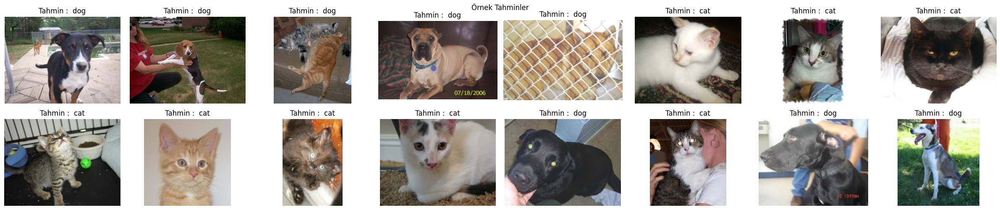

In [ ]:
sample_test = test_df.sample(16).reset_index(drop = True)

fig = plt.figure(1, figsize = (24, 20))
fig.suptitle("Örnek Tahminler")

for i in range(len(sample_test)):
    
    plt.subplot(8, 8, i + 1)
    image = load_img("/content/drive/MyDrive/kedi_kopek_unzip/test1/" + sample_test.file[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Tahmin :  {sample_test['test_preds'][i]}")
    
plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.models import Sequential

model.save("/content/drive/MyDrive/kedi_kopek_unzip/my_model.h5")
